In [1]:
%load_ext nb_black

<IPython.core.display.Javascript object>

In [2]:
# Imports
from os import makedirs
from os.path import join
import joblib
import numpy as np

rng_seed = 399
np.random.seed(rng_seed)
from scipy.spatial.distance import pdist, cdist, squareform
from matplotlib import pyplot as plt

import seaborn as sns

from tqdm.auto import tqdm
import pandas as pd

from sklearn.model_selection import ParameterGrid
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram, fcluster

from umap import UMAP
import plotly.offline as pyo

pyo.init_notebook_mode()

# Directory constants
analysis_of_embeddings_dir = ".."
analysis_of_embeddings_data_dir = join(analysis_of_embeddings_dir, "data")
root_code_dir = join(analysis_of_embeddings_dir, "..")
output_dir = join(root_code_dir, "output")
word2vec_training_dir = join(output_dir, "word2vec_training")
word2vec_cluster_analysis_dir = join(output_dir, "word2vec_cluster_analysis")
output_plots_dir = join("..", "output_plots")
makedirs(output_plots_dir, exist_ok=True)

# Extend sys path for importing custom Python files
import sys

sys.path.extend([analysis_of_embeddings_dir, root_code_dir])

from utils import (
    get_model_checkpoint_filepaths,
    pairwise_cosine_distances,
    create_word_embeddings_distances_matrix,
)
from analysis_utils import (
    plot_cluster_metric_scores,
    words_in_clusters,
    plot_cluster_sizes,
    inspect_word_clusters,
    load_word_cluster_group_words,
    visualize_word_cluster_groups,
    word_group_visualization,
)
from word_embeddings.word2vec import load_model_training_output
from vis_utils import configure_plotting_for_thesis

configure_plotting_for_thesis()

Plots configured for thesis!


[nltk_data] Downloading package punkt to /project/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


<IPython.core.display.Javascript object>

# Prepare data

In [3]:
# Load output from training word2vec
w2v_training_output = load_model_training_output(
    model_training_output_dir=join(
        word2vec_training_dir, "word2vec_enwiki_jan_2021_word2phrase"
    ),
    model_name="word2vec",
    dataset_name="enwiki",
)
last_embedding_weights = w2v_training_output["last_embedding_weights"]
words = w2v_training_output["words"]
word_to_int = w2v_training_output["word_to_int"]

<IPython.core.display.Javascript object>

In [4]:
# Restrict vocabulary size for analysis
vocab_size = 10000
vocabulary = np.arange(vocab_size)

<IPython.core.display.Javascript object>

In [5]:
# Compute cosine distance matrix
word_embeddings_distances = create_word_embeddings_distances_matrix(
    word_embeddings=last_embedding_weights,
    vocabulary=vocabulary,
)

<IPython.core.display.Javascript object>

In [6]:
# Transforming word embeddings into 2D UMAP space
word_embeddings_transformed = UMAP(
    n_components=2,
    metric="precomputed",
    random_state=rng_seed,
).fit_transform(word_embeddings_distances)

/usr/local/lib/python3.6/dist-packages/umap/umap_.py:1736: UserWarning:

using precomputed metric; transform will be unavailable for new data and inverse_transform will be unavailable for all data



<IPython.core.display.Javascript object>

In [7]:
# Load word groups data
word_groups_data = load_word_cluster_group_words(
    data_dir=analysis_of_embeddings_data_dir,
    word_to_int=word_to_int,
)
word_groups_data.keys()

dict_keys(['countries', 'country_capitals', 'forenames', 'surnames', 'numbers', 'video_games', 'foods', 'vegan_foods'])

<IPython.core.display.Javascript object>

## Creating plots for thesis

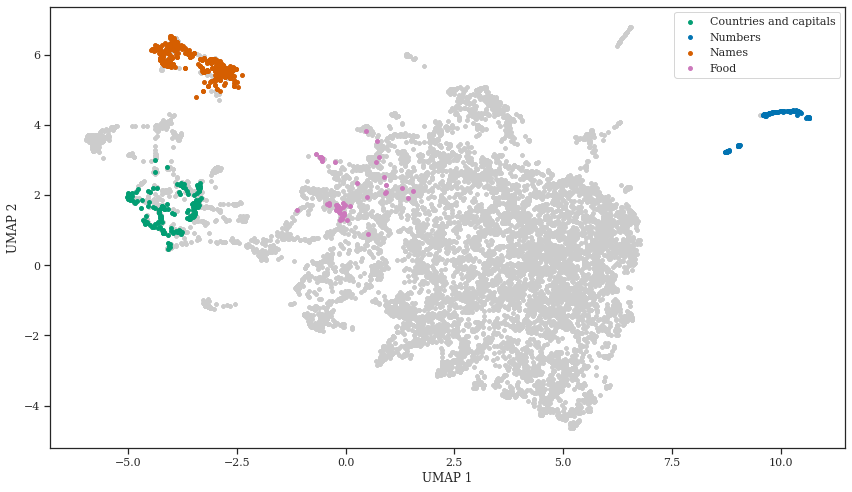

<IPython.core.display.Javascript object>

In [8]:
word_group_visualization(
    transformed_word_embeddings=word_embeddings_transformed,
    words=words[:vocab_size],
    word_groups={
        "countries_and_capitals": {
            "words": [
                *word_groups_data["countries"],
                *word_groups_data["country_capitals"],
            ],
            "boundaries": {
                "xmin": -5.5,
                "xmax": -2.5,
                "ymax": 3,
            },
            "color": "g",
            "label": "Countries and capitals",
        },
        "numbers": {
            "words": word_groups_data["numbers"],
            "color": "b",
            "boundaries": {"xmin": 7.5},
            "label": "Numbers",
        },
        "names": {
            "words": [
                *word_groups_data["forenames"]["all"],
                *word_groups_data["surnames"],
            ],
            "color": "r",
            "boundaries": {"xmin": -5, "xmax": -2, "ymin": 4.3},
            "label": "Names",
        },
        "foods": {
            "words": word_groups_data["foods"],
            "color": "m",
            "label": "Food",
            "boundaries": {"xmin": -2.5, "xmax": 2.5, "ymin": 0},
        },
    },
    xlabel="UMAP 1",
    ylabel="UMAP 2",
    alpha=1,
    scatter_set_rasterized=True,
    show_plot=False,
)

# Plot/save
save_to_pgf = True
plt.tight_layout()
if save_to_pgf:
    plt.savefig(
        join(
            output_plots_dir,
            "word-cluster-all-groups.pdf",
        ),
        backend="pgf",
    )
else:
    plt.show()

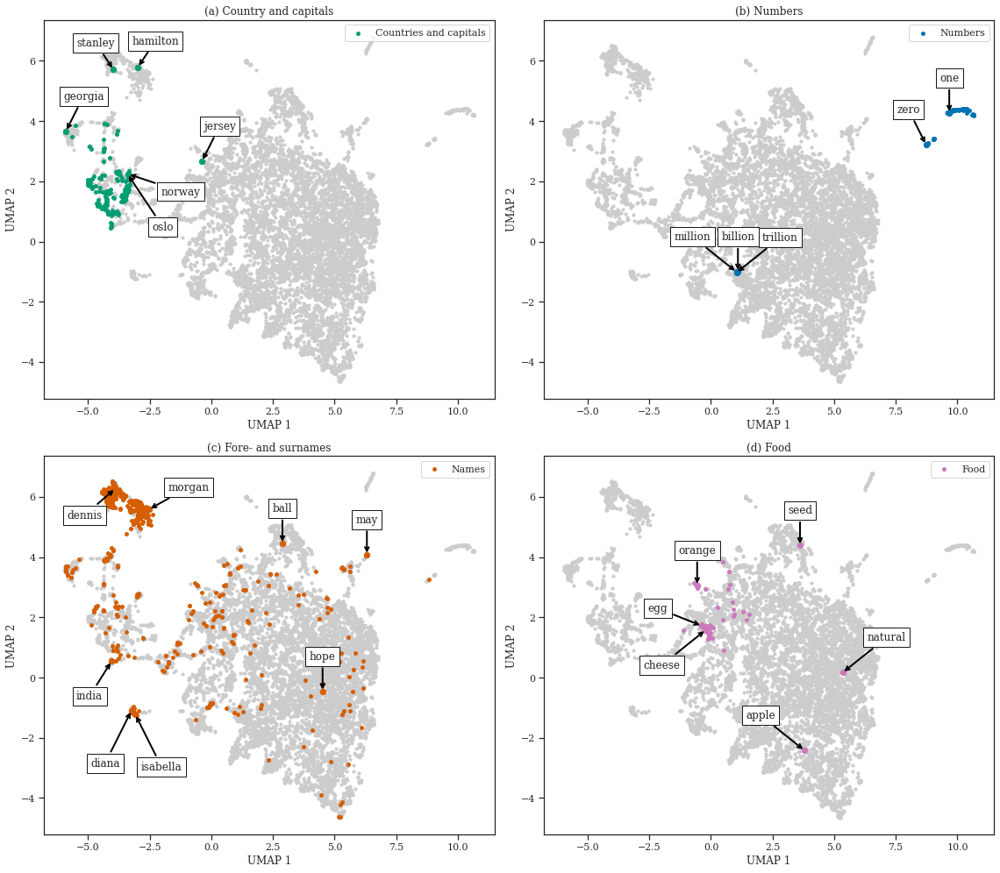

<IPython.core.display.Javascript object>

In [9]:
_, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, figsize=(8 * 2, 7 * 2))

# Countries and capitals
word_group_visualization(
    transformed_word_embeddings=word_embeddings_transformed,
    words=words[:vocab_size],
    word_groups={
        "countries_and_capitals": {
            "words": [
                *word_groups_data["countries"],
                *word_groups_data["country_capitals"],
            ],
            # "boundaries": {
            #    "xmin": -5.5,
            #    "xmax": -2.5,
            #    "ymax": 3,
            # },
            "color": "g",
            "label": "Countries and capitals",
        },
    },
    emphasis_words=[
        ("jersey", 20, 0),
        ("hamilton", 20, -10),
        ("stanley", -20, -10),
        ("georgia", 20, 0),
        ("norway", 60, -60),
        ("oslo", 40, -100),
    ],
    xlabel="UMAP 1",
    ylabel="UMAP 2",
    alpha=1,
    ax=ax1,
    scatter_set_rasterized=True,
    show_plot=False,
)
ax1.set_title("(a) Country and capitals")
ax1.legend(loc="upper right")

# Numbers
word_group_visualization(
    transformed_word_embeddings=word_embeddings_transformed,
    words=words[:vocab_size],
    word_groups={
        "numbers": {
            "words": word_groups_data["numbers"],
            "color": "b",
            "label": "Numbers",
        },
    },
    emphasis_words=[
        ("million", -50, 0),
        "billion",
        ("trillion", 50, 0),
        "one",
        ("zero", -20, 0),
    ],
    xlabel="UMAP 1",
    ylabel="UMAP 2",
    alpha=1,
    ax=ax2,
    scatter_set_rasterized=True,
    show_plot=False,
)
ax2.set_title("(b) Numbers")

# Names
word_group_visualization(
    transformed_word_embeddings=word_embeddings_transformed,
    words=words[:vocab_size],
    word_groups={
        "names": {
            "words": [
                *word_groups_data["forenames"]["all"],
                *word_groups_data["surnames"],
            ],
            "color": "r",
            "label": "Names",
        },
    },
    emphasis_words=[
        "hope",
        "may",
        ("india", -25, -80),
        "ball",
        ("dennis", -35, -70),
        ("morgan", 45, -15),
        ("isabella", 30, -100),
        ("diana", -30, -100),
    ],
    xlabel="UMAP 1",
    ylabel="UMAP 2",
    alpha=1,
    ax=ax3,
    scatter_set_rasterized=True,
    show_plot=False,
)
ax3.set_title("(c) Fore- and surnames")

# Food
word_group_visualization(
    transformed_word_embeddings=word_embeddings_transformed,
    words=words[:vocab_size],
    word_groups={
        "foods": {
            "words": word_groups_data["foods"],
            "color": "m",
            "label": "Food",
            "boundaries": {"xmin": -2.5, "xmax": 2.5, "ymin": 0},
        },
    },
    emphasis_words=[
        ("apple", -50, 0),
        "orange",
        "seed",
        ("natural", 50, 0),
        ("egg", -50, -20),
        ("cheese", -50, -80),
    ],
    xlabel="UMAP 1",
    ylabel="UMAP 2",
    alpha=1,
    ax=ax4,
    scatter_set_rasterized=True,
    show_plot=False,
)
ax4.set_title("(d) Food")

# Plot/save
save_to_pgf = True
plt.tight_layout()
if save_to_pgf:
    plt.savefig(
        join(
            output_plots_dir,
            "word-cluster-all-groups-emphasis-plots.pdf",
        ),
        backend="pgf",
    )
else:
    plt.show()

## Countries/capitals

In [11]:
visualize_word_cluster_groups(
    transformed_word_embeddings=word_embeddings_transformed,
    words=words[:vocab_size],
    word_groups={
        "countries": {
            "words": word_groups_data["countries"],
            "color": "green",
        },
        "country_capitals": {
            "words": word_groups_data["country_capitals"],
            "color": "cyan",
        },
    },
    visualize_non_group_words=True,
    xlabel="UMAP 1",
    ylabel="UMAP 2",
    alpha=1,
    interactive=True,
)

<IPython.core.display.Javascript object>

**Observation**: Here we observe that most country/capital words are clustered around UMAP 1 < -2 and UMAP 2 = 0. We have one outlier, the word "jersey", where UMAP 1 > -1. After manual inspection we observe that the neighbouring words are related to clothes.

## Names

In [12]:
visualize_word_cluster_groups(
    transformed_word_embeddings=word_embeddings_transformed,
    words=words[:vocab_size],
    word_groups={
        "forenames_male": {
            "words": word_groups_data["forenames"]["male"],
            "color": "green",
        },
        "forenames_female": {
            "words": word_groups_data["forenames"]["female"],
            "color": "cyan",
        },
        "forenames_intersection": {
            "words": word_groups_data["forenames"]["intersection"],
            "color": "orange",
        },
        "surnames": {
            "words": word_groups_data["surnames"],
            "color": "magenta",
        },
    },
    visualize_non_group_words=True,
    xlabel="UMAP 1",
    ylabel="UMAP 2",
    alpha=1,
    interactive=True,
)

<IPython.core.display.Javascript object>

**Observation:** We observe that the fore- and surnames are spread all over the 10k most common words visualization. First thing we observe is the cluster consisting of both fore- and surnames at UMAP 1 $\in [-5, -2]$ and UMAP 2 $\in [4, 7]$. When zooming into the cluster, we observe that female and male forenames are separated into individual clusters. Outside that area, most surnames are spread all over the 10k most common words. The surnames data consists of a big range of surnames used in the US and, as expected, we observe that common words such as "joy", "page" or "good" are a part of the surnames, and therefore, spans the most common words very well.

## Numbers

In [13]:
visualize_word_cluster_groups(
    transformed_word_embeddings=word_embeddings_transformed,
    words=words[:vocab_size],
    word_groups={
        "numbers": {
            "words": word_groups_data["numbers"],
            "color": "green",
        },
    },
    visualize_non_group_words=True,
    xlabel="UMAP 1",
    ylabel="UMAP 2",
    alpha=1,
    interactive=True,
)

<IPython.core.display.Javascript object>

**Observation**: Here we see that numbers are being clustered when UMAP 1 > 8. There are also three outliers for the words "million", "billion" and "trillion". After manual inspection, we see that they are close to economy related words such as sale, purchase and transcation.

## Video games

In [14]:
visualize_word_cluster_groups(
    transformed_word_embeddings=word_embeddings_transformed,
    words=words[:vocab_size],
    word_groups={
        "video_games": {
            "words": word_groups_data["video_games"]["all"],
            "color": "green",
        },
    },
    visualize_non_group_words=True,
    xlabel="UMAP 1",
    ylabel="UMAP 2",
    alpha=1,
    interactive=True,
)

<IPython.core.display.Javascript object>

**Observation:** There is only a single video game-related word in the top 10000 most common words, which is the Major League Baseball. We zoomed in on the region and observed that there are other sports-related words there as well.

## Foods

In [15]:
visualize_word_cluster_groups(
    transformed_word_embeddings=word_embeddings_transformed,
    words=words[:vocab_size],
    word_groups={
        "foods": {
            "words": word_groups_data["foods"],
            "color": "green",
        },
    },
    visualize_non_group_words=True,
    xlabel="UMAP 1",
    ylabel="UMAP 2",
    alpha=1,
    interactive=True,
)

<IPython.core.display.Javascript object>

**Observation:** We see that there are only a few food words in the top 10k most common words. The food words in the top 10k words were clustered near similar meaning words. In particular, we observe a cluster of food related words at UMAP 1 $\in [-0.5, 0.5]$ and UMAP 2 $\in [1.5, 2.5]$. There are, however, some food words with multiple meanings, such as apple (fruit and company) and orange (fruit and colour).